In [2]:
import numpy as np
import pandas as pd
import pymc3 as pm
import arviz as az

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
az.style.use('arviz-darkgrid')

/Users/benjaminwee/anaconda/lib/python3.6/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


# Easy       

## 8E1
Metropolis algorithm - Proposal distribtion must be symmetric. Probability of jumping from A->B is equal to the probability of jumping from B->A

Metropolis hastings allows for assymetric proposals.

## 8E2

Gibbs sampler is more efficient -> fewer samples to get a good estimate of posterior distribution -- relative to metropolis approach. Gibbs uses adaptive proposals -> distribution of proposed parameter adjusts itself depending on current parameter values.

Limitation - Requires conjugate priors.

## 8E3

HMC can't sample discrete variables or distributions like poisson and binomial distributions (unless its in the likelihood). Can't flow or 'move' between integers.

## 8E4

n_eff, the effective number of samples, does a statistical adjustment to say: if we had a chain with samples that were uncorrelated with each other (a 'perfect' chain), how many samples would be need to have the same information in the actual chain. 

## 8E5

RHat should approach 1. 

# Medium

## 8M1

In [3]:
rugged_df = (pd.read_csv('/Users/benjaminwee/Documents/courses/resources/Rethinking/Data/rugged.csv', sep=';')
               .assign(log_gdp=lambda rugged: np.log(rugged.rgdppc_2000))
               .dropna(subset=['log_gdp']))

In [4]:
with pm.Model() as m1_1:
    a = pm.Normal('a', 0, 100)
    bR = pm.Normal('bR', 0, 10)
    bA = pm.Normal('bA', 0, 10)
    bAR = pm.Normal('bAR', 0, 10)
    mu = a + bR * rugged_df.rugged + bA * rugged_df.cont_africa + bAR * rugged_df.rugged * rugged_df.cont_africa
    sigma = pm.Uniform('sigma', 0, 10)
    log_gdp = pm.Normal('log_gdp', mu, sigma, observed=rugged_df.l og_gdp)
    trace_m1_1 = pm.sample(1000, tune = 1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, bAR, bA, bR, a]
Sampling 4 chains: 100%|██████████| 8000/8000 [00:04<00:00, 1630.10draws/s]


In [5]:
with pm.Model() as m1_2:
    a = pm.Normal('a', 0, 100)
    bR = pm.Normal('bR', 0, 10)
    bA = pm.Normal('bA', 0, 10)
    bAR = pm.Normal('bAR', 0, 10)
    mu = a + bR * rugged_df.rugged + bA * rugged_df.cont_africa + bAR * rugged_df.rugged * rugged_df.cont_africa
    sigma = pm.Exponential('sigma', 1)
    log_gdp = pm.Normal('log_gdp', mu, sigma, observed=rugged_df.log_gdp)
    trace_m1_2 = pm.sample(1000, tune = 1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, bAR, bA, bR, a]
Sampling 4 chains: 100%|██████████| 8000/8000 [00:04<00:00, 1765.24draws/s]


In [6]:
az.summary(trace_m1_1, ['~mu'])

,mean,sd,hpd_3%,hpd_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
a,9.222,0.137,8.973,9.486,0.003,0.002,1876.0,1874.0,1877.0,2370.0,1.0
bR,-0.203,0.076,-0.341,-0.052,0.002,0.001,1926.0,1913.0,1927.0,2637.0,1.0
bA,-1.946,0.221,-2.350,-1.529,0.005,0.004,1949.0,1923.0,1949.0,2139.0,1.0
bAR,0.394,0.129,0.140,0.624,0.003,0.002,2104.0,2096.0,2114.0,2679.0,1.0
sigma,0.950,0.051,0.858,1.050,0.001,0.001,3448.0,3418.0,3479.0,2431.0,1.0


In [7]:
az.summary(trace_m1_2, ['~mu'])

,mean,sd,hpd_3%,hpd_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
a,9.220,0.140,8.963,9.491,0.003,0.002,1751.0,1749.0,1751.0,2390.0,1.0
bR,-0.202,0.078,-0.339,-0.043,0.002,0.001,1834.0,1824.0,1842.0,2396.0,1.0
bA,-1.941,0.232,-2.354,-1.475,0.005,0.004,1923.0,1896.0,1929.0,2144.0,1.0
bAR,0.390,0.131,0.130,0.620,0.003,0.002,1834.0,1780.0,1842.0,2320.0,1.0
sigma,0.949,0.052,0.858,1.050,0.001,0.001,3496.0,3451.0,3562.0,2742.0,1.0


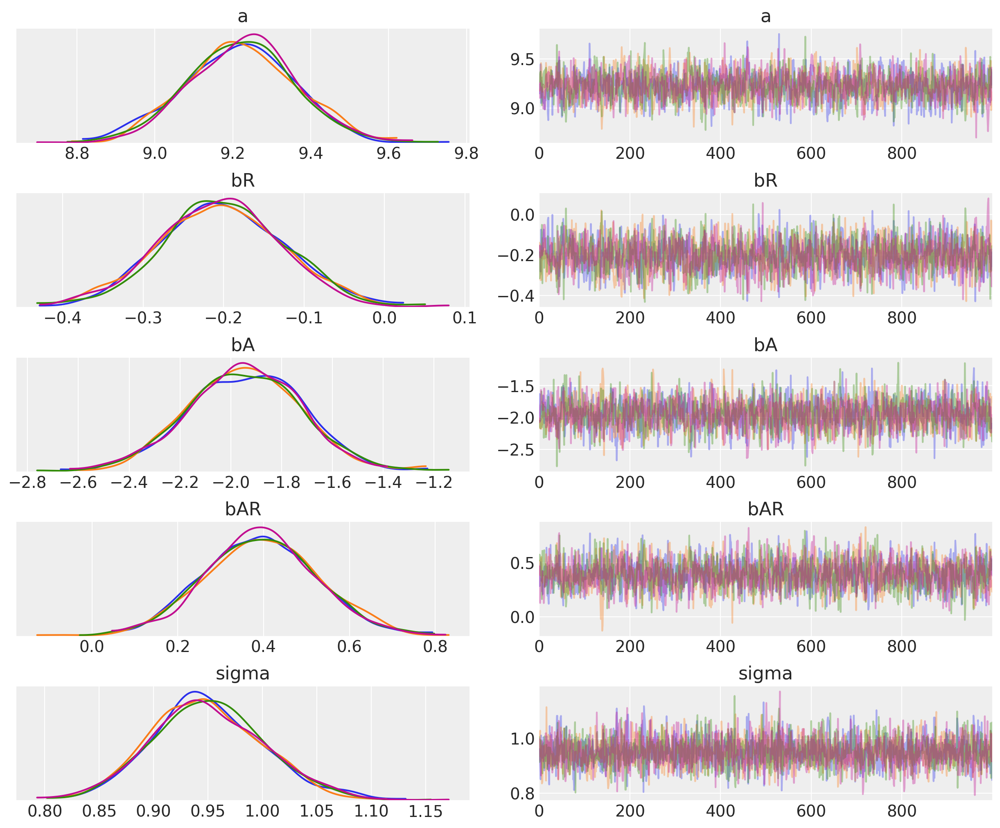

In [8]:
pm.traceplot(trace_m1_1, ['~mu']);

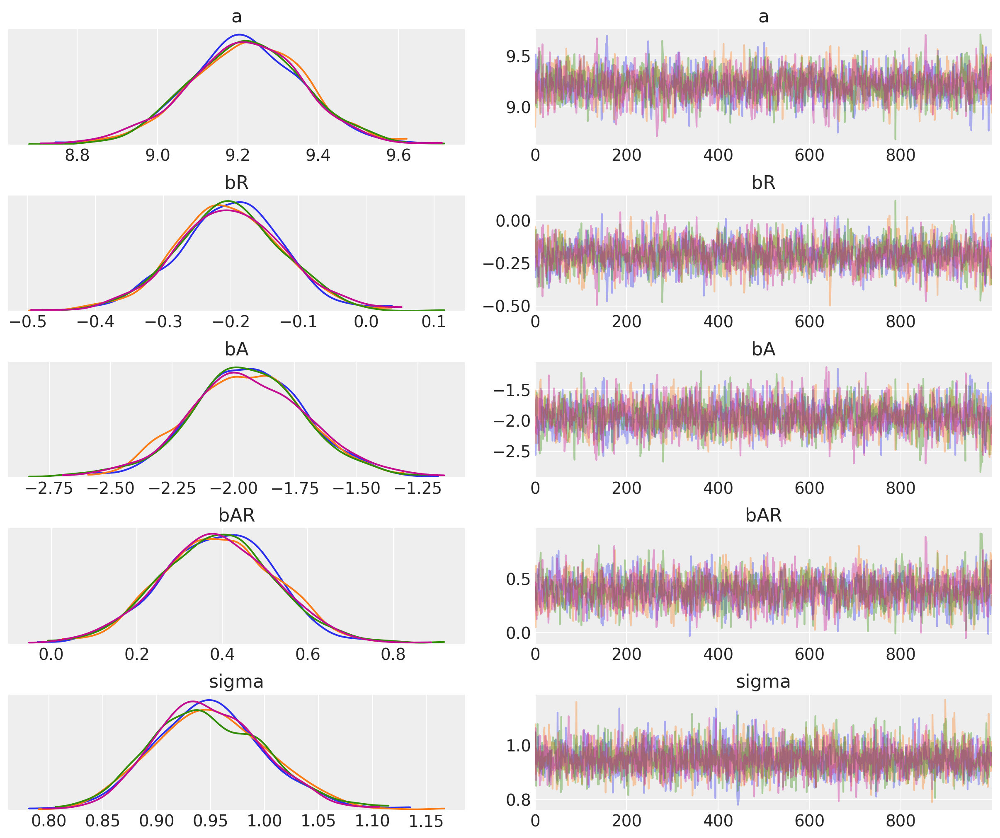

In [9]:
pm.traceplot(trace_m1_2, ['~mu']);

Mean and overall shape of sigma posterior about the same. Priors are quite weak.

In [4]:
# Try with half cauchy prior on sigma
with pm.Model() as m8_1:
    a = pm.Normal('a', 0, 100)
    bR = pm.Normal('bR', 0, 10)
    bA = pm.Normal('bA', 0, 10)
    bAR = pm.Normal('bAR', 0, 10)
    mu = a + bR * rugged_df.rugged + bA * rugged_df.cont_africa + bAR * rugged_df.rugged * rugged_df.cont_africa
    sigma = pm.HalfCauchy('sigma', 2)
    log_gdp = pm.Normal('log_gdp', mu, sigma, observed=rugged_df.log_gdp)
    trace_m8_1 = pm.sample(1000, tune = 1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, bAR, bA, bR, a]
Sampling 4 chains: 100%|██████████| 8000/8000 [00:04<00:00, 1722.48draws/s]


In [11]:
az.summary(trace_m8_1, ['~mu'])

,mean,sd,hpd_3%,hpd_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
a,9.224,0.139,8.966,9.485,0.003,0.002,1991.0,1989.0,1996.0,2279.0,1.0
bR,-0.203,0.077,-0.356,-0.067,0.002,0.001,1942.0,1910.0,1944.0,2547.0,1.0
bA,-1.946,0.227,-2.372,-1.516,0.005,0.003,2138.0,2120.0,2140.0,2653.0,1.0
bAR,0.391,0.129,0.156,0.632,0.003,0.002,2006.0,2006.0,1999.0,2566.0,1.0
sigma,0.949,0.052,0.852,1.046,0.001,0.001,3405.0,3397.0,3406.0,2829.0,1.0


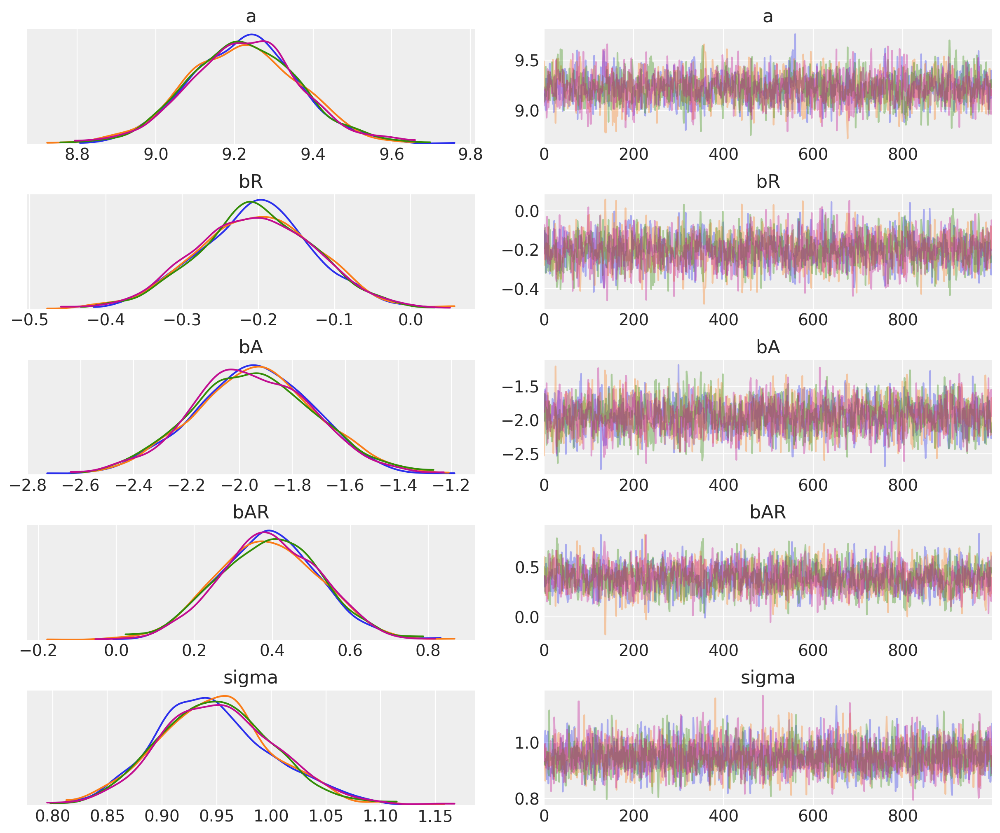

In [12]:
pm.traceplot(trace_m8_1, ['~mu']);

## 8M2

In [13]:
with pm.Model() as m2_1:
    a = pm.Normal('a', 0, 100)
    bR = pm.Normal('bR', 0, 10)
    bA = pm.Normal('bA', 0, 10)
    bAR = pm.Normal('bAR', 0, 10)
    mu = a + bR * rugged_df.rugged + bA * rugged_df.cont_africa + bAR * rugged_df.rugged * rugged_df.cont_africa
    sigma = pm.Exponential('sigma', 0.1)
    log_gdp = pm.Normal('log_gdp', mu, sigma, observed=rugged_df.log_gdp)
    trace_m2_1 = pm.sample(1000, tune = 1000)
    
with pm.Model() as m2_2:
    a = pm.Normal('a', 0, 100)
    bR = pm.Normal('bR', 0, 10)
    bA = pm.Normal('bA', 0, 10)
    bAR = pm.Normal('bAR', 0, 10)
    mu = a + bR * rugged_df.rugged + bA * rugged_df.cont_africa + bAR * rugged_df.rugged * rugged_df.cont_africa
    sigma = pm.HalfCauchy('sigma', 0.1)
    log_gdp = pm.Normal('log_gdp', mu, sigma, observed=rugged_df.log_gdp)
    trace_m2_2 = pm.sample(1000, tune = 1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, bAR, bA, bR, a]
Sampling 4 chains: 100%|██████████| 8000/8000 [00:05<00:00, 1551.80draws/s]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, bAR, bA, bR, a]
Sampling 4 chains: 100%|██████████| 8000/8000 [00:04<00:00, 1804.83draws/s]


In [14]:
az.summary(trace_m2_1, ['~mu'])

,mean,sd,hpd_3%,hpd_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
a,9.228,0.144,8.968,9.505,0.003,0.002,1755.0,1754.0,1756.0,2081.0,1.0
bR,-0.205,0.080,-0.360,-0.062,0.002,0.001,1668.0,1533.0,1687.0,2015.0,1.0
bA,-1.960,0.230,-2.368,-1.504,0.005,0.004,1810.0,1756.0,1819.0,1950.0,1.0
bAR,0.399,0.134,0.151,0.653,0.003,0.002,1751.0,1660.0,1764.0,2678.0,1.0
sigma,0.950,0.051,0.858,1.048,0.001,0.001,3563.0,3542.0,3594.0,2815.0,1.0


In [15]:
az.summary(trace_m2_2, ['~mu'])

,mean,sd,hpd_3%,hpd_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
a,9.224,0.140,8.967,9.489,0.003,0.002,1763.0,1763.0,1764.0,2201.0,1.0
bR,-0.202,0.077,-0.347,-0.056,0.002,0.001,1790.0,1790.0,1779.0,2309.0,1.0
bA,-1.948,0.231,-2.401,-1.533,0.005,0.004,2037.0,2037.0,2040.0,2495.0,1.0
bAR,0.393,0.132,0.140,0.632,0.003,0.002,2073.0,2073.0,2075.0,2803.0,1.0
sigma,0.945,0.052,0.852,1.042,0.001,0.001,3758.0,3722.0,3811.0,2965.0,1.0


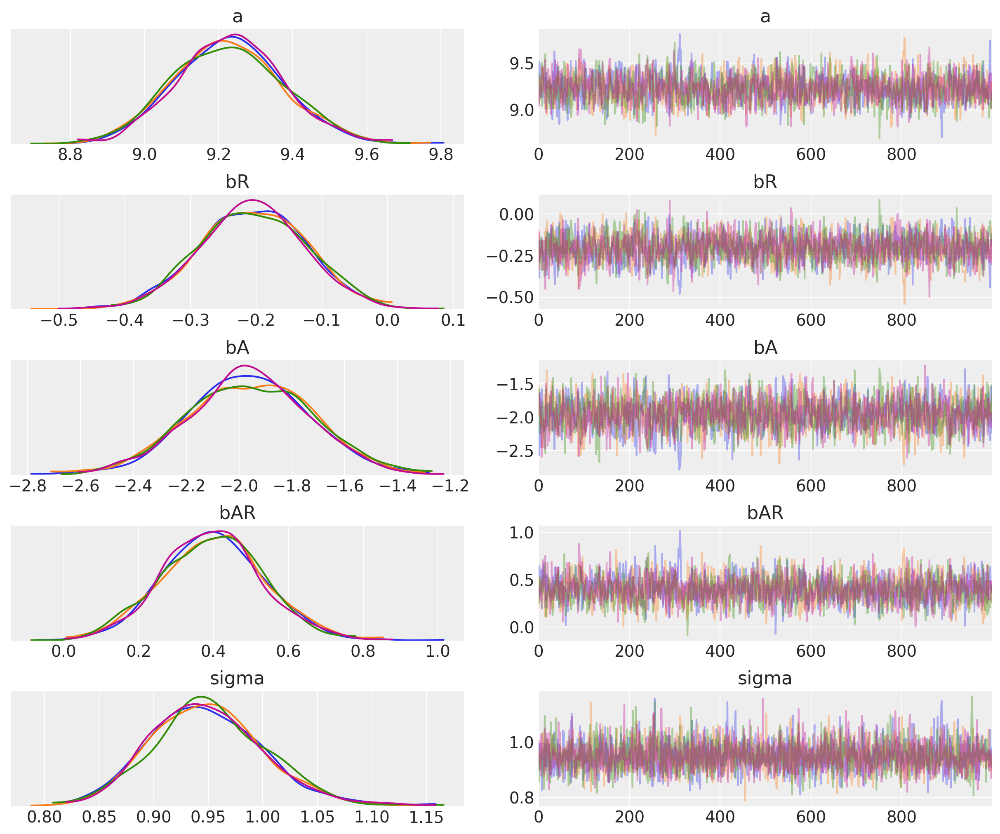

In [16]:
pm.traceplot(trace_m2_1, ['~mu']);

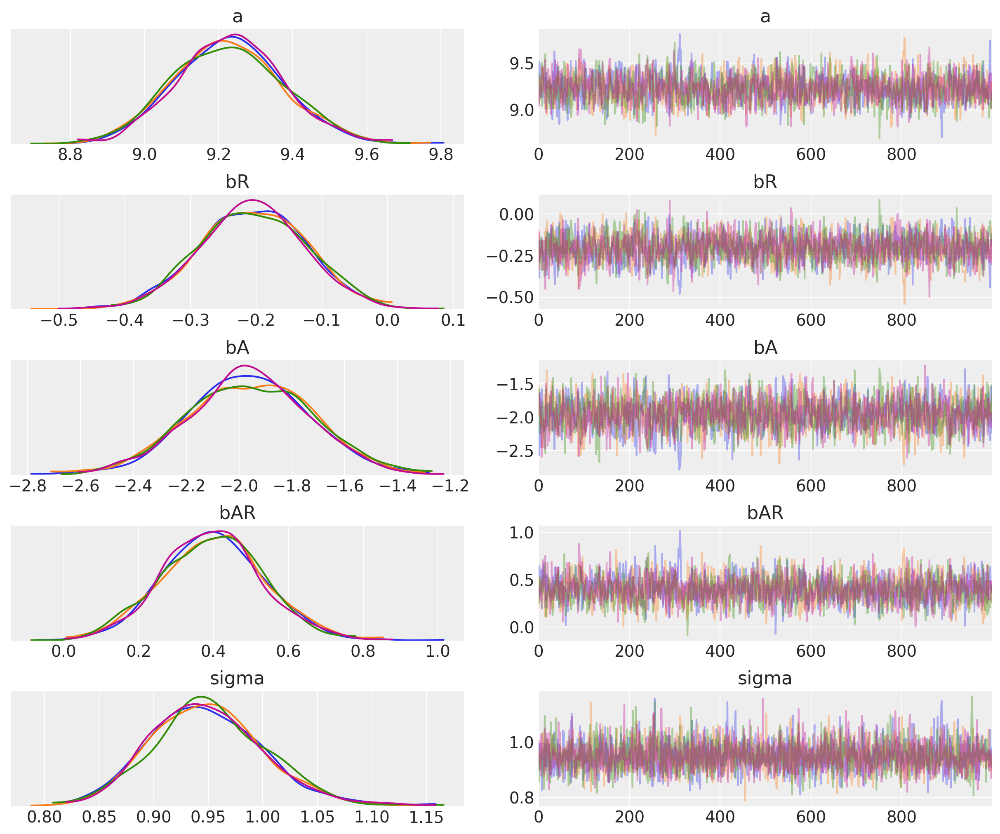

In [17]:
pm.traceplot(trace_m2_1, ['~mu']);

Posteriors for sigma look the same for exponential and HalfCauchy priors. Had errors when trying just a Cauchy distribution. Shape of sigma with exponential prior noticably different, slightly more symmetric when using smaller scale parameters.

## 8M3

In [18]:
with pm.Model() as m3_1:
    a = pm.Normal('a', 0, 100)
    bR = pm.Normal('bR', 0, 10)
    bA = pm.Normal('bA', 0, 10)
    bAR = pm.Normal('bAR', 0, 10)
    mu = a + bR * rugged_df.rugged + bA * rugged_df.cont_africa + bAR * rugged_df.rugged * rugged_df.cont_africa
    sigma = pm.HalfCauchy('sigma', 0.1)
    log_gdp = pm.Normal('log_gdp', mu, sigma, observed=rugged_df.log_gdp)
    trace_m3_1 = pm.sample(1000, tune = 500)
    
with pm.Model() as m3_2:
    a = pm.Normal('a', 0, 100)
    bR = pm.Normal('bR', 0, 10)
    bA = pm.Normal('bA', 0, 10)
    bAR = pm.Normal('bAR', 0, 10)
    mu = a + bR * rugged_df.rugged + bA * rugged_df.cont_africa + bAR * rugged_df.rugged * rugged_df.cont_africa
    sigma = pm.HalfCauchy('sigma', 0.1)
    log_gdp = pm.Normal('log_gdp', mu, sigma, observed=rugged_df.log_gdp)
    trace_m3_2 = pm.sample(1000, tune = 100)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, bAR, bA, bR, a]
Sampling 4 chains: 100%|██████████| 6000/6000 [00:03<00:00, 1631.86draws/s]
The acceptance probability does not match the target. It is 0.8836453765275365, but should be close to 0.8. Try to increase the number of tuning steps.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, bAR, bA, bR, a]
Sampling 4 chains: 100%|██████████| 4400/4400 [00:09<00:00, 477.20draws/s]
The acceptance probability does not match the target. It is 0.9086380095820904, but should be close to 0.8. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.9802367902886122, but should be close to 0.8. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.976594768663662, but should be cl

In [19]:
# 1000 warm up samples
az.summary(trace_m2_2, ['~mu'])

,mean,sd,hpd_3%,hpd_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
a,9.224,0.140,8.967,9.489,0.003,0.002,1763.0,1763.0,1764.0,2201.0,1.0
bR,-0.202,0.077,-0.347,-0.056,0.002,0.001,1790.0,1790.0,1779.0,2309.0,1.0
bA,-1.948,0.231,-2.401,-1.533,0.005,0.004,2037.0,2037.0,2040.0,2495.0,1.0
bAR,0.393,0.132,0.140,0.632,0.003,0.002,2073.0,2073.0,2075.0,2803.0,1.0
sigma,0.945,0.052,0.852,1.042,0.001,0.001,3758.0,3722.0,3811.0,2965.0,1.0


In [20]:
# 500 warmup samples
az.summary(trace_m3_1, ['~mu'])

,mean,sd,hpd_3%,hpd_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
a,9.230,0.141,8.972,9.497,0.004,0.003,1583.0,1583.0,1584.0,2420.0,1.0
bR,-0.207,0.078,-0.349,-0.061,0.002,0.001,1548.0,1548.0,1551.0,1949.0,1.0
bA,-1.956,0.228,-2.392,-1.543,0.006,0.004,1693.0,1693.0,1697.0,2343.0,1.0
bAR,0.398,0.132,0.152,0.640,0.003,0.002,1656.0,1656.0,1656.0,2315.0,1.0
sigma,0.946,0.052,0.851,1.046,0.001,0.001,3062.0,3055.0,3072.0,2452.0,1.0


In [21]:
# 100 warmup samples (this took a while)
az.summary(trace_m3_2, ['~mu'])

,mean,sd,hpd_3%,hpd_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
a,9.223,0.140,8.965,9.494,0.003,0.002,1624.0,1624.0,1627.0,2451.0,1.0
bR,-0.204,0.076,-0.352,-0.067,0.002,0.001,1531.0,1531.0,1534.0,2250.0,1.0
bA,-1.950,0.222,-2.358,-1.519,0.007,0.005,1089.0,1089.0,1092.0,1359.0,1.0
bAR,0.398,0.126,0.163,0.628,0.004,0.003,916.0,916.0,918.0,1126.0,1.0
sigma,0.945,0.053,0.847,1.046,0.001,0.001,3763.0,3730.0,3780.0,2554.0,1.0


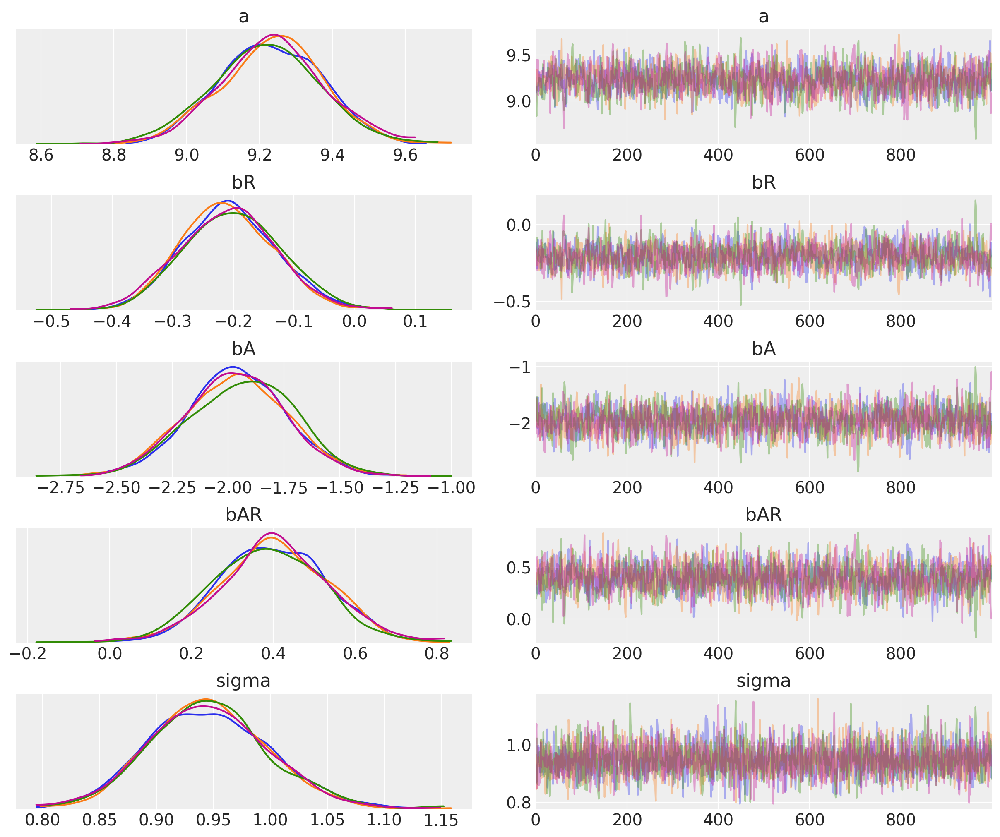

In [22]:
pm.traceplot(trace_m3_1, ['~mu']);

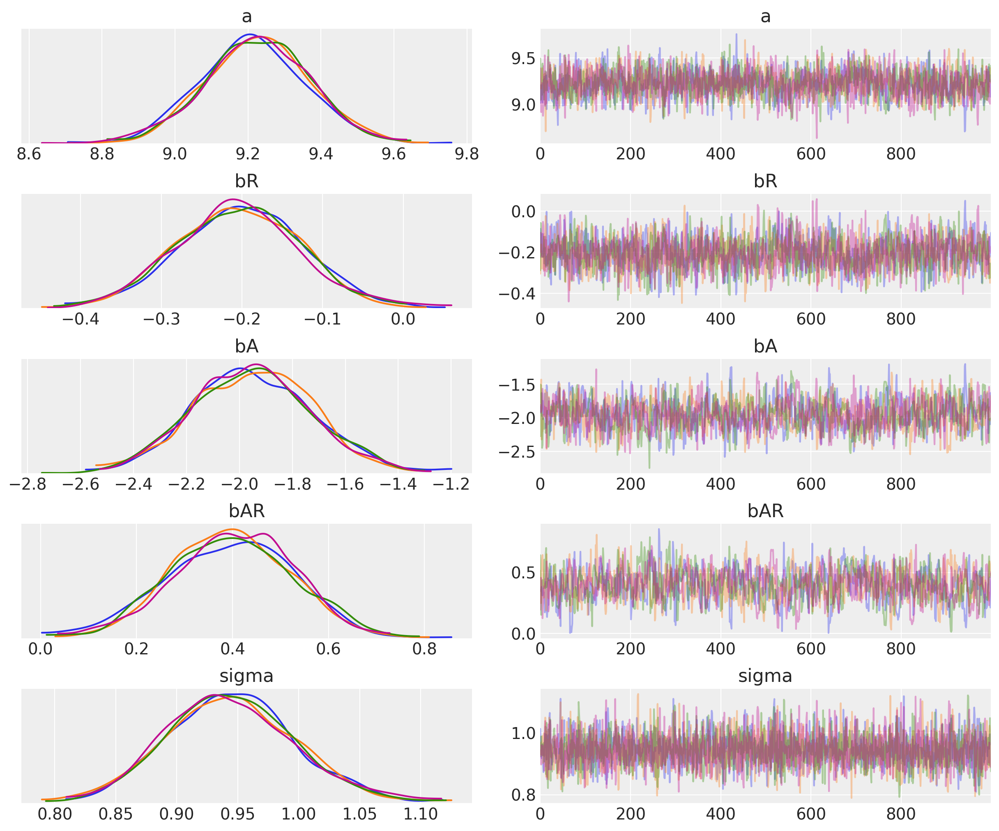

In [25]:
pm.traceplot(trace_m3_2, ['~mu']);

# Hard

## 8H1

In [26]:
with pm.Model() as h1_1:
    a = pm.Normal('a', 0, 1)
    b = pm.HalfCauchy('b', 1)
    trace_h1_1 = pm.sample(1000, tune=100)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [b, a]
Sampling 4 chains: 100%|██████████| 4400/4400 [00:01<00:00, 4302.40draws/s]
The acceptance probability does not match the target. It is 0.9221449148342925, but should be close to 0.8. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.8928736072961888, but should be close to 0.8. Try to increase the number of tuning steps.
The number of effective samples is smaller than 25% for some parameters.


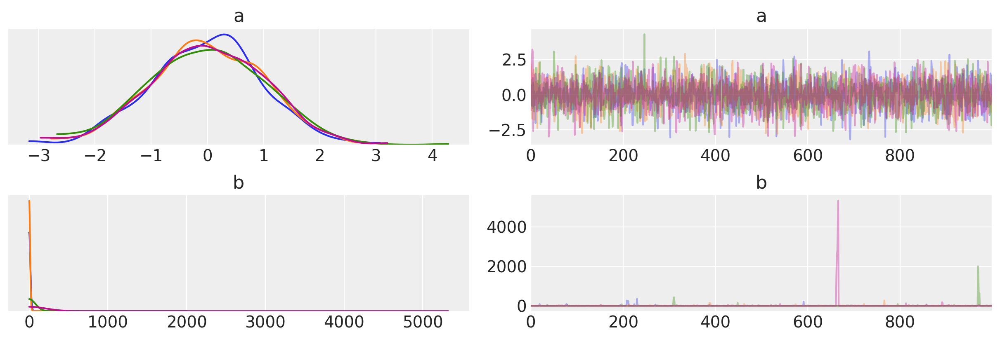

In [27]:
pm.traceplot(trace_h1_1, ['~mu']);

Gaussian has finite mean and variance. Cauchy has no moments. Hence the sporatic behaviour of the cauchy traceplots.

## 8H2

The model code is taken directly from PyMC3 dev's translation of the textbook code + adding the WAIC comparison at the end

In [28]:
d = pd.read_csv('/Users/benjaminwee/Documents/courses/resources/Rethinking/Data/WaffleDivorce.csv',
                sep = ';')

d['MedianAgeMarriage_s'] = (d.MedianAgeMarriage - d.MedianAgeMarriage.mean()) / d.MedianAgeMarriage.std()
d['Marriage_s'] = (d.Marriage - d.Marriage.mean()) / d.Marriage.std()

with pm.Model() as model_5_1:
    a = pm.Normal('a', mu=10, sd=10)
    bA = pm.Normal('bA', mu=0, sd=1)
    sigma = pm.HalfCauchy('sigma', 5)
    mu = pm.Deterministic('mu', a + bA * d.MedianAgeMarriage_s)
    Divorce = pm.Normal('Divorce', mu=mu, sd=sigma, observed=d.Divorce)
    trace_5_1 = pm.sample(1000, tune=1000)
    
with pm.Model() as model_5_2:
    a = pm.Normal('a', mu=10, sd=10)
    bA = pm.Normal('bA', mu=0, sd=1)
    sigma = pm.HalfCauchy('sigma', 5)
    mu = pm.Deterministic('mu', a + bA * d.Marriage_s)
    Divorce = pm.Normal('Divorce', mu=mu, sd=sigma, observed=d.Divorce)
    trace_5_2 = pm.sample(1000, tune=1000)
    
with pm.Model() as model_5_3:
    a = pm.Normal('a', mu=10, sd=10)
    bA = pm.Normal('bA', mu=0, sd=1, shape=2)
    sigma = pm.HalfCauchy('sigma', 5)
    mu = pm.Deterministic('mu', a + bA[0] * d.Marriage_s + bA[1] * d.MedianAgeMarriage_s)
    Divorce = pm.Normal('Divorce', mu=mu, sd=sigma, observed=d.Divorce)
    trace_5_3 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, bA, a]
Sampling 4 chains: 100%|██████████| 8000/8000 [00:02<00:00, 3447.99draws/s]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, bA, a]
Sampling 4 chains: 100%|██████████| 8000/8000 [00:02<00:00, 3359.89draws/s]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, bA, a]
Sampling 4 chains: 100%|██████████| 8000/8000 [00:03<00:00, 2498.53draws/s]


In [29]:
compare = az.compare({'model_5_c1': trace_5_1,
                      'model_5_c2' : trace_5_2,
                      'model_5_c3' : trace_5_3})

compare

/Users/benjaminwee/anaconda/lib/python3.6/site-packages/arviz/stats/stats.py:1126: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  "For one or more samples the posterior variance of the log predictive "
/Users/benjaminwee/anaconda/lib/python3.6/site-packages/arviz/stats/stats.py:1126: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  "For one or more samples the posterior variance of the log predictive "


,rank,waic,p_waic,d_waic,weight,se,dse,warning,waic_scale
model_5_c1,0,186.15,3.81184,0,0.626256,13.1191,0,True,deviance
model_5_c3,1,187.934,4.89682,1.78436,0.27343,9.58819,0.805921,True,deviance
model_5_c2,2,199.874,3.1807,13.7245,0.100314,13.3462,9.07246,True,deviance


Model with just median marriage age performs best. Model with just marriage rate performs the worst. This suggests that after accounting for median age of marriage, marriage rate does not add much predictive power to the model.

## 8H3

In [30]:
from scipy import stats
N = 100
height = stats.norm.rvs(size=N, loc=10, scale=2)
leg_prop = stats.uniform.rvs(size=N, loc=0.4, scale=0.5) 
leg_left = leg_prop * height + stats.norm.rvs(size=N, loc=0, scale=0.02)
leg_right = leg_prop * height + stats.norm.rvs(size=N, loc=0, scale=0.02)

In [31]:
# Same as PyMC devs example
with pm.Model() as h3_1:
    a = pm.Normal('a', mu=10, sd=100)
    bl = pm.Normal('bl', mu=2, sd=10)
    br = pm.Normal('br', mu=2, sd=10)
    mu = pm.Deterministic('mu', a + bl * leg_left + br * leg_right)    
    sigma = pm.HalfCauchy('sigma', 1)
    height_p = pm.Normal('height_p', mu=mu, sd=sigma, observed=height)
    trace_h3_1 = pm.sample(1000, tune=1000, start={
            'bl': 0,
            'br': 0,
            'alpha': 10,
            'sigma': 1})

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, br, bl, a]
Sampling 4 chains: 100%|██████████| 8000/8000 [02:52<00:00, 46.50draws/s]
There were 2 divergences after tuning. Increase `target_accept` or reparameterize.


In [32]:
az.summary(trace_h3_1, ['~mu']);

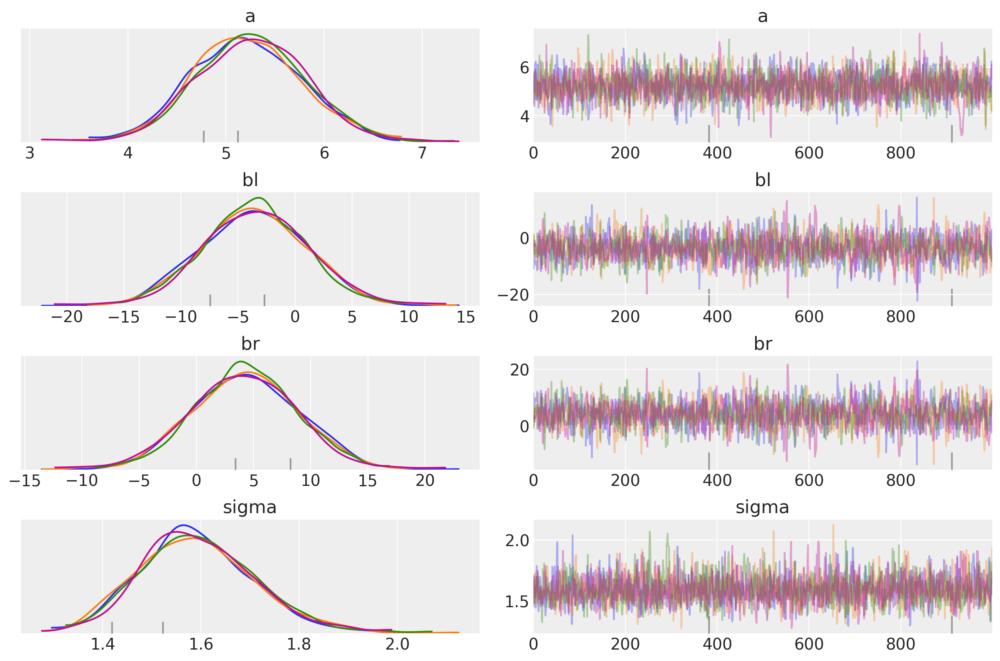

In [33]:
pm.traceplot(trace_h3_1, ['~mu']);

In [34]:
# Truncate normal distibution by using halfnormal
with pm.Model() as h3_2:
    a = pm.Normal('a', mu=10, sd=100)
    bl = pm.Normal('bl', mu=2, sd=10)
    br = pm.HalfNormal('br', 5)
    mu = pm.Deterministic('mu', a + bl * leg_left + br * leg_right)    
    sigma = pm.HalfCauchy('sigma', 1)
    height_p = pm.Normal('height_p', mu=mu, sd=sigma, observed=height)
    trace_h3_2 = pm.sample(2000, tune=1000, start={
            'bl': 0,
            'br': 0,
            'alpha': 10,
            'sigma': 1})

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, br, bl, a]
Sampling 4 chains:   0%|          | 0/12000 [00:00<?, ?draws/s]/Users/benjaminwee/anaconda/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
INFO (theano.gof.compilelock): Waiting for existing lock by unknown process (I am process '34330')
INFO (theano.gof.compilelock): Waiting for existing lock by unknown process (I am process '34331')
INFO (theano.gof.compilelock): To manually release the lock, delete /Users/benjaminwee/.theano/compiledir_Darwin-18.7.0-x86_64-i386-64bit-i386-3.6.5-64/lock_dir
INFO (theano.gof.compilelock): To manually release the lock, delete /Users/benjaminwee/.theano/compiledir_Darwin-18.7.0-x86_64-i386-64bit-i386-3.6.5-64/lock_dir
/Users/benjaminwee/anaconda/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  

ParallelSamplingError: Bad initial energy

INFO (theano.gof.compilelock): Waiting for existing lock by unknown process (I am process '34331')
INFO (theano.gof.compilelock): To manually release the lock, delete /Users/benjaminwee/.theano/compiledir_Darwin-18.7.0-x86_64-i386-64bit-i386-3.6.5-64/lock_dir
/Users/benjaminwee/anaconda/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/benjaminwee/anaconda/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)


In [ ]:
az.summary(trace_h3_2, ['~mu'])

In [ ]:
pm.traceplot(trace_h3_2, ['~mu']);

## 8H4

In [ ]:
compare = az.compare({'model_8_c1': trace_h3_1,
                      'model_8_c2' : trace_h3_2})

compare